In [ ]:
!pip install geopandas
!pip install contextily

     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 15.4 MB 34.1 MB/s 
     |████████████████████████████████| 6.3 MB 34.1 MB/s 
     |████████████████████████████████| 19.3 MB 1.3 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%matplotlib inline
import pandas as pd
import geopandas
import contextily
from shapely.geometry import Point
import matplotlib.pyplot as plt

**Prendere in considerazione i dati caricati precedentemente e quelli relativi ai corsi d'acqua della provincia di Milano allegati al presente post. Realizzare poi un notebook che:**

In [ ]:
corsi_acqua = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Corsi_acqua_Piano_di_Gestione.zip')
corsi_acqua

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
2,215,IT03N0080447LO,naturale,Lombardia,Lambro (Fiume),Lambro (Asta),06SS4N,sì,sì,sì,no,sì,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,21811.145089,"MULTILINESTRING ((536963.747 5005395.412, 5369..."
3,252,IT03N008044003021LO,naturale,Lombardia,Garbogera (Torrente),Lambro (Asta),06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,19767.119220,"LINESTRING (509280.513 5047845.024, 509281.795..."
4,255,IT03N0080440441LO,naturale,Lombardia,Sillaro Salerano,Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,13180.757122,"LINESTRING (528977.056 5024109.798, 528981.181..."
5,256,IT03N0080440701LO,naturale,Lombardia,Addetta (Colatore),Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,9403.459186,"MULTILINESTRING ((530299.337 5029522.740, 5302..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
7,65,ITIRN0080984IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,sufficiente,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,38206.257375,"MULTILINESTRING ((483579.882 5034726.498, 4835..."
8,66,ITIRN0080982IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,sì,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,35927.352062,"MULTILINESTRING ((477067.969 5044605.066, 4770..."
9,67,ITIRN0080983IR,naturale,Lombardia_Piemonte,Ticino (Fiume),Ticino Sub Lacuale,06GL2N,sì,sì,sì,sì,sì,no,no,sì,no,sì,TICINO,no,no,buono,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,mantenimento dello stato buono,Nessuna proroga o deroga,17917.785813,"MULTILINESTRING ((477477.600 5043097.081, 4774..."


In [ ]:
province = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Mappa Italia/ProvCM01012021_g')
province

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,539249.811270,6.828137e+09,"POLYGON ((411015.006 5049970.983, 411266.039 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,418078.067821,2.082097e+09,"POLYGON ((438328.612 5087208.215, 439028.888 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,250242.112077,1.341318e+09,"POLYGON ((460929.542 5076320.298, 461165.259 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,490111.881318,6.898443e+09,"MULTIPOLYGON (((378673.492 4958865.159, 378928..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,315563.261771,1.508947e+09,"POLYGON ((425041.329 4997628.309, 424948.989 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,1,1,103,0,103,Verbano-Cusio-Ossola,-,Verbano-Cusio-Ossola,VB,Provincia,299029.117691,2.262164e+09,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,126272.490811,4.055793e+08,"POLYGON ((519754.706 5065242.380, 520199.702 5..."
104,3,11,109,0,109,Fermo,-,Fermo,FM,Provincia,198635.321418,8.619365e+08,"POLYGON ((884760.019 4804406.440, 885511.011 4..."
105,4,16,110,0,110,Barletta-Andria-Trani,-,Barletta-Andria-Trani,BT,Provincia,237762.889058,1.542032e+09,"POLYGON ((1081237.144 4611047.023, 1081399.393..."


**1. visualizzi su una mappa i 10 corsi d'acqua più lunghi della provincia di Milano**



In [ ]:
prov_milano = province[province["DEN_UTS"]=="Milano"]
prov_milano

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
14,1,3,15,215,215,-,Milano,Milano,MI,Citta metropolitana,309951.219188,1.575033e+09,"MULTIPOLYGON (((538136.289 5004372.814, 539162..."


In [ ]:
corsi_milano = corsi_acqua[corsi_acqua.within(prov_milano.geometry.squeeze())]
corsi_milano # corsi d'acqua nella provincia di Milano

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
3,252,IT03N008044003021LO,naturale,Lombardia,Garbogera (Torrente),Lambro (Asta),06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,19767.119220,"LINESTRING (509280.513 5047845.024, 509281.795..."
5,256,IT03N0080440701LO,naturale,Lombardia,Addetta (Colatore),Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,9403.459186,"MULTILINESTRING ((530299.337 5029522.740, 5302..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
11,89,IT03N0080410020107012LO,naturale,Lombardia,Merlata (Torrente),Olona,06IN7N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,sufficiente,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,6596.411258,"LINESTRING (508090.899 5042218.610, 508089.941..."
12,91,IT03N008044002013LO,naturale,Lombardia,Olona (Fiume),Olona,06SS2D,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,14141.256453,"MULTILINESTRING ((496168.003 5046279.338, 4961..."
14,111,IT03N00804100201082LO,naturale,Lombardia,Pudica (Torrente),Olona,06IN7N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,10073.652302,"MULTILINESTRING ((508837.773 5045937.205, 5088..."
16,113,IT03N008044003071LO,naturale,Lombardia,Vettabbia (Cavo),Lambro (Asta),06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,10660.764389,"LINESTRING (518545.443 5029547.737, 518544.379..."
19,169,IT03N00800119113011LO,naturale,Lombardia,Cava (Torrente),Adda Sub Lacuale (Asta),06IN7N,sì,no,sì,no,no,no,no,no,no,no,ADDA,sì,sì,scarso,media,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,8405.867432,"MULTILINESTRING ((532925.930 5047367.573, 5329..."


In [ ]:
corsi_l = corsi_milano.nlargest(10,"SHAPE_LEN")
corsi_l # corsi d'acqua più lunghi della provincia di Milano

,OBJECTID,COD_PTUA16,NATURA,REGIONE,NOME,SOTTOBACIN,TIPOLOGIA,A_PROTETTA,SENSIBILE,VULNERABIL,D_HABITAT,D_UCCELLI,RAMSAR,BALNEAZION,VITA_PESCI,USO_POTAB,AREE_A_PR,BACINO,RAGG_ECO,RAGG_CHI,STATO_ECO,CONF_ECO,STATO_CHI,CONF_CHI,ANNI_CHI,ANNI_ECO,OBB_CHI,OBB_ECO,ESENZIONI,SHAPE_LEN,geometry
0,188,IT03POTI3GRCA1LO,artificiale,Lombardia,Naviglio Grande (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,sufficiente,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,44301.215986,"LINESTRING (480362.262 5040575.220, 480364.627..."
1,191,IT03POTI3SNCA1LO,artificiale,Lombardia,Scolmatore Piene Nord - Ovest (Canale),nd,None,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,34035.857991,"MULTILINESTRING ((494060.091 5029696.046, 4940..."
32,398,IT03POTI3NPCA1LO,artificiale,Lombardia,Naviglio Pavese (Canale),nd,None,sì,no,sì,no,no,no,no,no,no,no,TICINO,no,no,scarso,media,buono,media,2009-2014,2009-2014,mantenimento dello stato buono,buono al 2021,Art. 4.4 per obiettivo ecologico,33448.858573,"LINESTRING (513927.378 5033222.100, 513927.258..."
35,565,IT03POAD3VACA1LO,artificiale,Lombardia,Vailata (Roggia),nd,None,sì,no,sì,no,no,no,no,no,no,sì,ADDA,no,no,sufficiente,media,non buono,media,2012-2014,2012-2014,buono al 2021,buono al 2021,Art. 4.4 per obiettivo ecologico e chimico,20751.104448,"LINESTRING (541818.985 5047325.989, 541818.901..."
3,252,IT03N008044003021LO,naturale,Lombardia,Garbogera (Torrente),Lambro (Asta),06IN7N,sì,no,sì,sì,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,sì,sì,scarso,media,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,19767.119220,"LINESTRING (509280.513 5047845.024, 509281.795..."
28,448,IT03N008001091014LO,naturale,Lombardia,Seveso (Torrente),Seveso,06SS3D,sì,no,sì,no,no,no,no,no,no,sì,LAMBRO - OLONA MERIDIONALE,no,no,cattivo,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18469.448374,"LINESTRING (512157.688 5048463.394, 512157.976..."
6,282,IT03POLSRECA1LO,artificiale,Lombardia,Redefossi (Cavo),nd,06SS1N,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,scarso,alta,buono,alta,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,18403.681560,"LINESTRING (514894.561 5036362.164, 514898.993..."
44,676,IT03N0080981411LO,naturale,Lombardia,Navigliaccio (Colatore),Ticino Sub Lacuale,06SS1N,sì,no,sì,sì,sì,no,no,no,no,sì,TICINO,no,no,NC,None,NC,None,2014,2014,buono al 2021,buono al 2021,Art. 4.4 per obiettivo ecologico e chimico,18105.747329,"LINESTRING (507915.612 5019743.337, 507917.175..."
27,358,IT03N008044002014LO,naturale,Lombardia,Olona (Fiume),Olona,06SS3D,sì,no,sì,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,cattivo,alta,buono,media,2012-2014,2012-2014,mantenimento dello stato buono,buono al 2027,Art. 4.4 per obiettivo ecologico,15816.452967,"LINESTRING (504109.620 5040607.275, 504113.432..."
33,428,IT03N0080590011LO,naturale,Lombardia,Carona (Roggia),Olona Meridionale,06SS1N,no,no,no,no,no,no,no,no,no,no,LAMBRO - OLONA MERIDIONALE,no,no,NC,None,NC,None,2014,2014,buono al 2021,buono al 2021,Art. 4.4 per obiettivo ecologico e chimico,15629.880279,"MULTILINESTRING ((507915.612 5019743.337, 5079..."


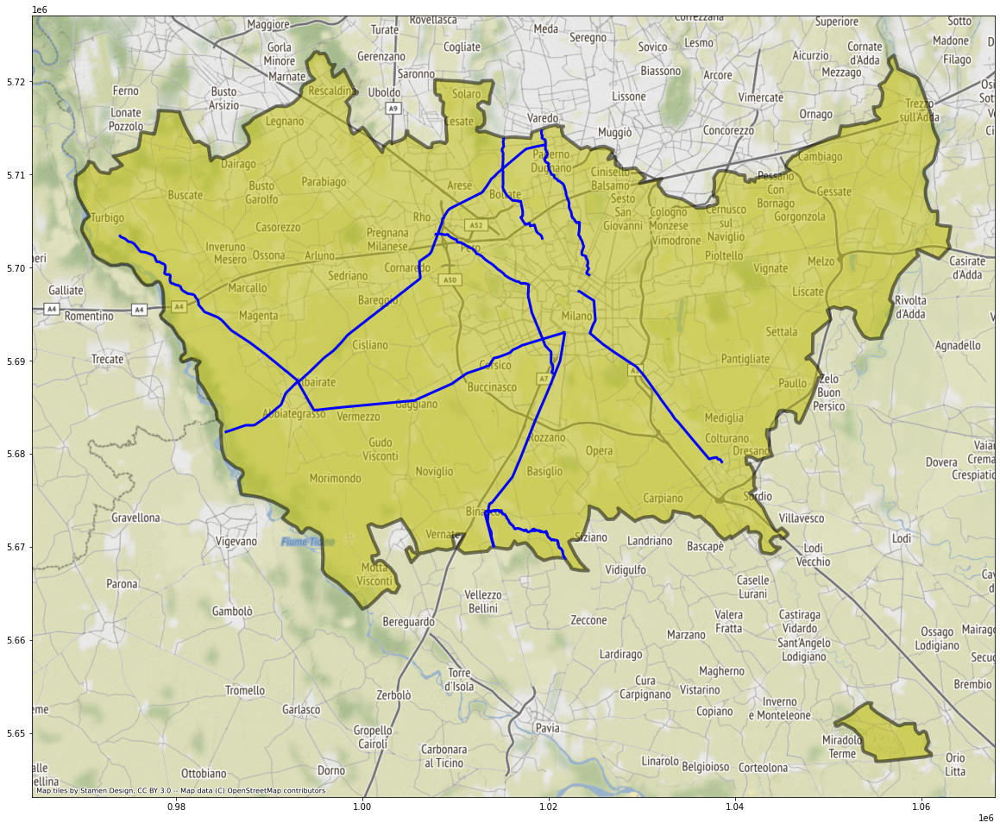

In [ ]:
ax = corsi_l.to_crs(epsg=3857).plot(figsize= (20, 20), facecolor="none", edgecolor="b", linewidth=3)
prov_milano.to_crs(epsg=3857).plot(ax=ax, facecolor="y", alpha=0.5, linewidth=4, edgecolor="k")
contextily.add_basemap(ax=ax)

**2. visualizzi su una mappa i Navigli e i fiumi da cui prendono l'acqua. Utilizzare colori diversi per rappresentare i navigli rispetto ai fiumi ed evidenziare bene i percorsi sulla mappa**



In [ ]:
navigli = corsi_acqua[corsi_acqua["NOME"].str.contains("Navigl")]

In [ ]:
fiumi = corsi_acqua[corsi_acqua.intersects(navigli.geometry.squeeze().unary_union)]

In [ ]:
fiumi = fiumi[~fiumi["NOME"].str.contains("Navigl")]

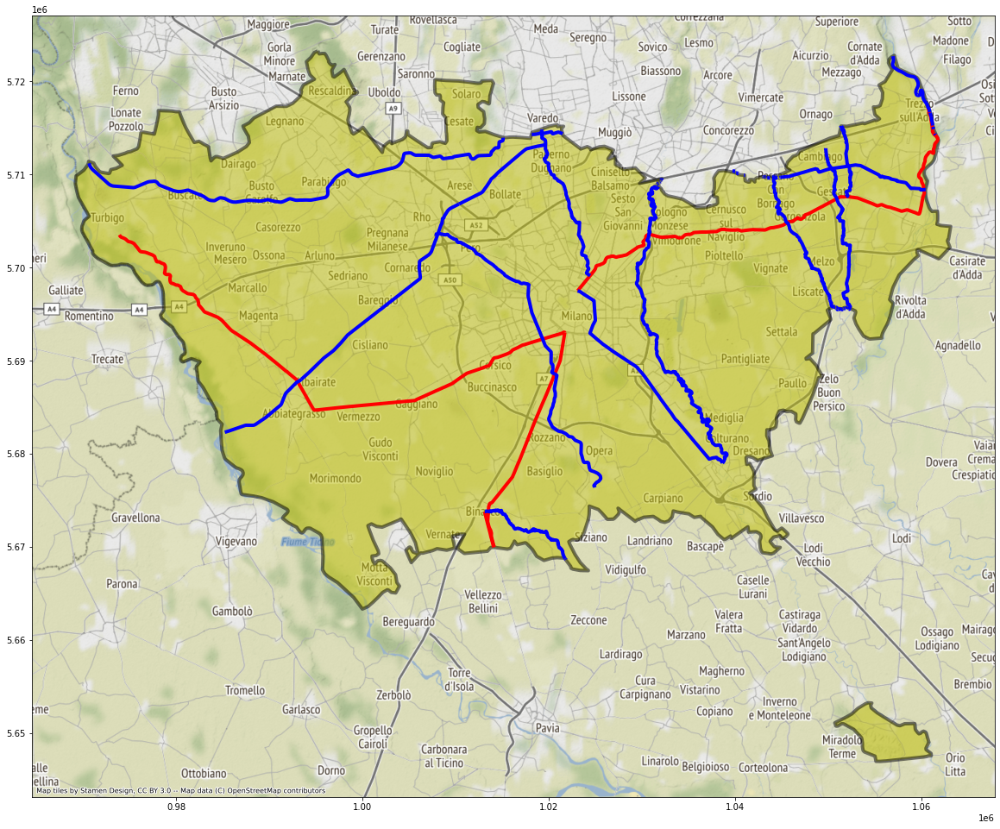

In [ ]:
ax = prov_milano.to_crs(epsg=3857).plot(figsize=(20, 20), facecolor="y", alpha=0.5, linewidth=4, edgecolor="k")
navigli.to_crs(epsg=3857).plot(ax=ax, linewidth=4, edgecolor="r")
fiumi.to_crs(epsg=3857).plot(ax=ax, linewidth=4, edgecolor="b")
contextily.add_basemap(ax=ax)

**3. visualizzi su una mappa i corsi d'acqua che passano in un comune inserito dall'utente**

In [ ]:
comuni = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Mappa Italia/Com01012021_g')

Inserisci un comune: Cormano
Corsi d'acqua che attraversano il comune di        COD_RIP  ...                                           geometry
1853        1  ...  POLYGON ((513324.450 5044373.750, 513413.918 5...

[1 rows x 13 columns] : 
 28    Seveso (Torrente)
Name: NOME, dtype: object


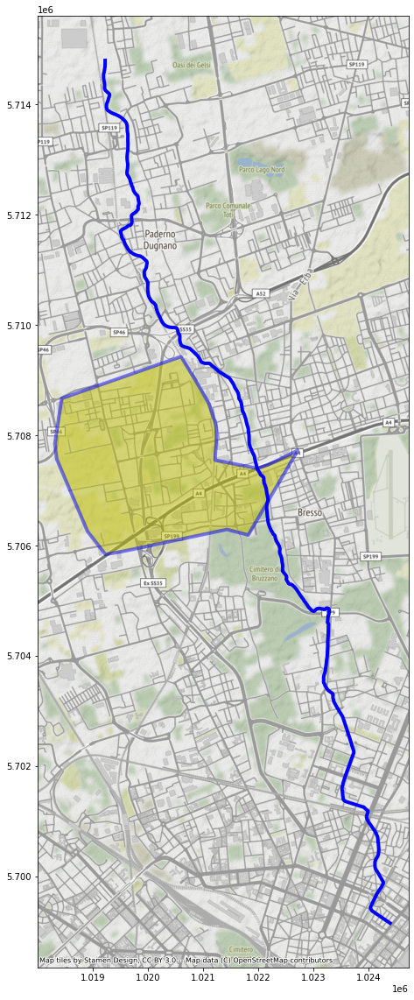

In [ ]:
n_comune = input("Inserisci un comune: ")
comune = comuni[comuni["COMUNE"] == n_comune]
squeeze_comune = comune.geometry.squeeze()
corsi_attraver = corsi_acqua[corsi_acqua.intersects(squeeze_comune)]
corsi_attraver
print("Corsi d'acqua che attraversano il comune di ", comune, ": \n", corsi_attraver.NOME)
ax = comune.to_crs(epsg=3857).plot(figsize=(20, 20), facecolor="y", alpha = 0.5, edgecolor="b", linewidth=4)
corsi_attraver.to_crs(epsg=3857).plot(ax=ax, linewidth=4, edgecolor="b")
contextily.add_basemap(ax=ax)

**4. visualizzi su una mappa un fiume inserito dall'utente con tutti i comuni  che attraversa. Se attraversa Milano, visualizzare solo i quartieri che attraversa**

In [ ]:
quartieri_milano = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/quartieri di Milano/ds964_nil_wm.zip')
quartieri_milano

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
2,67,PORTELLO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3800.750663,9.096022e+05,91,"POLYGON ((9.15636 45.48785, 9.15724 45.48721, ..."
3,81,BOVISASCA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7105.469715,1.578028e+06,92,"POLYGON ((9.16803 45.52234, 9.16687 45.52027, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
...,...,...,...,...,...,...,...,...,...
83,68,PAGANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5221.836696,1.289686e+06,172,"POLYGON ((9.17174 45.47619, 9.17150 45.47595, ..."
84,2,BRERA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5461.667196,1.637333e+06,173,"POLYGON ((9.19165 45.46906, 9.19105 45.46843, ..."
85,33,ROGOREDO - SANTA GIULIA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6012.496435,1.200116e+06,174,"POLYGON ((9.24044 45.44427, 9.24084 45.44424, ..."
86,17,ADRIANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,9276.875747,2.433358e+06,175,"POLYGON ((9.26729 45.51234, 9.26701 45.51241, ..."


Inserire il nome di un fiume: Naviglio Grande (Canale)


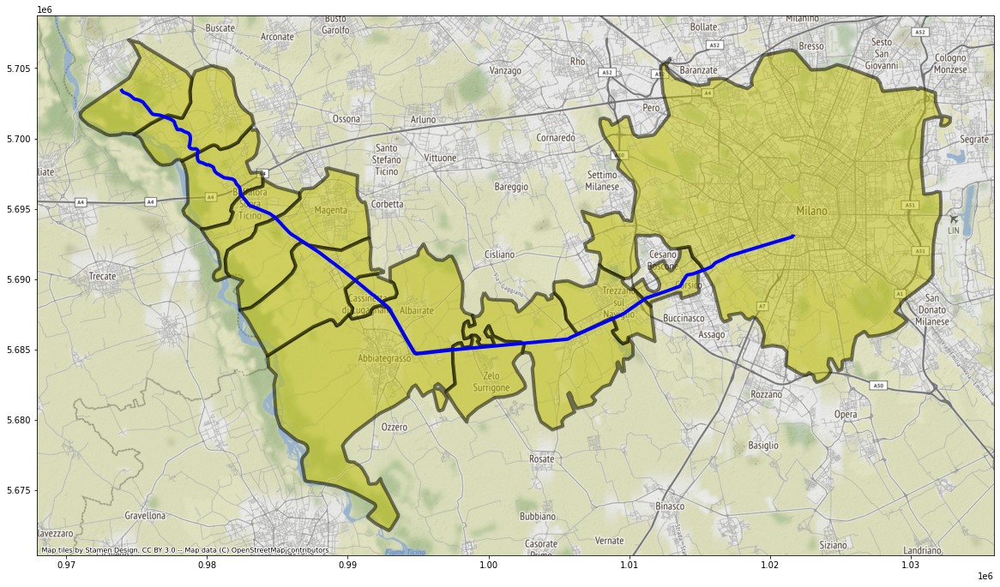

In [ ]:
n_fiume = input("Inserire il nome di un fiume: ")
fiume = corsi_acqua[corsi_acqua["NOME"] == n_fiume]
squeeze_fiume = fiume.geometry.squeeze()
comuni_attraversati = comuni[comuni.intersects(squeeze_fiume)]
# if comuni_attraversati.contains(quartieri_milano):
  # quartieri_milano
# else:
comuni_attraversati
ax = fiume.to_crs(epsg=3857).plot(figsize=(20, 20), edgecolor="b", linewidth=4)
comuni_attraversati.to_crs(epsg=3857).plot(ax=ax, facecolor="y", alpha=0.5, edgecolor="k", linewidth=4)
contextily.add_basemap(ax=ax)

**5. visualizzi il numero di corsi d'acqua della provincia di Milano e la lunghezza totale di tutti i corsi d'acqua**

In [ ]:
print("Numero corsi d'acqua della provincia di Milano: ", corsi_milano.count()['NOME'])
lun_corsi_milano = corsi_milano.length
print("Lunghezza totale di tutti i corsi d'acqua: ", lun_corsi_milano.sum())

Numero corsi d'acqua della provincia di Milano:  19
Lunghezza totale di tutti i corsi d'acqua:  248843.84027786582


**6. visualizzi su unamappa i comuni della provincia di Milano che non sono attraversati da corsi d'acqua**

In [ ]:
comuni_milano = comuni[comuni.within(prov_milano.geometry.squeeze())]
comuni_milano

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1811,1,3,15,215,215,15002,015002,Abbiategrasso,None,0,43048.321516,4.777153e+07,"POLYGON ((493446.898 5029705.643, 493602.897 5..."
1812,1,3,15,215,215,15005,015005,Albairate,None,0,18919.829233,1.567417e+07,"POLYGON ((495595.883 5032525.624, 495661.881 5..."
1813,1,3,15,215,215,15007,015007,Arconate,None,0,14414.349393,8.611972e+06,"POLYGON ((488023.938 5045041.530, 488050.939 5..."
1814,1,3,15,215,215,15009,015009,Arese,None,0,14252.406342,6.317493e+06,"POLYGON ((506416.116 5045124.529, 506782.458 5..."
1815,1,3,15,215,215,15010,015010,Arluno,None,0,18646.960825,1.278364e+07,"POLYGON ((496562.280 5041533.478, 496401.277 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1939,1,3,15,215,215,15247,015247,Zibido San Giacomo,None,0,29317.414806,2.443786e+07,"POLYGON ((506102.367 5028375.154, 506991.706 5..."
1940,1,3,15,215,215,15248,015248,Villa Cortese,None,0,8393.080188,3.499843e+06,"POLYGON ((490864.917 5047319.512, 491416.914 5..."
1941,1,3,15,215,215,15249,015249,Vanzaghello,None,0,13065.614920,5.624381e+06,"POLYGON ((484327.133 5049844.538, 484144.917 5..."
1942,1,3,15,215,215,15250,015250,Baranzate,None,0,6567.963947,2.944838e+06,"POLYGON ((509363.172 5042554.492, 509538.293 5..."


In [ ]:
corsi_squeeze = corsi_acqua.geometry.squeeze()

In [ ]:
corsi_union = corsi_squeeze.unary_union

In [ ]:
corsi_union

In [ ]:
comuni_no_corsi = comuni_milano[~comuni_milano.intersects(corsi_union)]
comuni_no_corsi

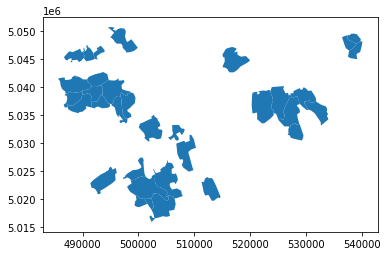

In [ ]:
comuni_no_corsi.plot()

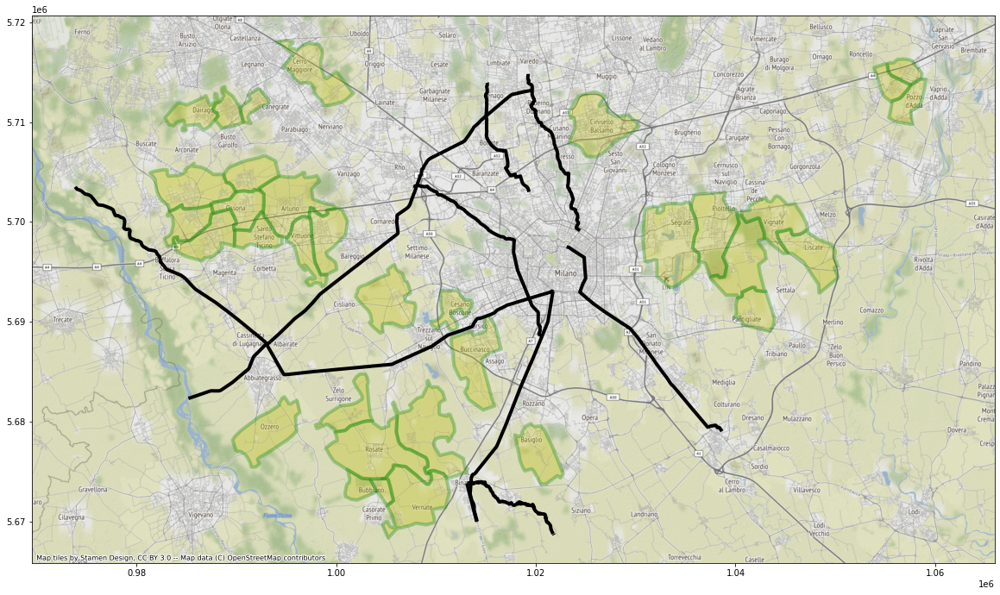

In [ ]:
ax = comuni_no_corsi.to_crs(epsg=3857).plot(figsize= (20, 20),facecolor = "y", alpha= 0.3, edgecolor = "g", linewidth = 4)
corsi_l.to_crs(epsg = 3857).plot(ax = ax,linewidth=4, edgecolor = "k" )
contextily.add_basemap(ax=ax)